In [63]:
"Random Agent Playing Atari Breakout"


import gymnasium as gym
import torch
import torch.nn as nn
import torchvision.transforms as T
import matplotlib.pyplot as plt
from collections import deque
import random
import numpy as np
import ale_py
import logging
import os
import json
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display
import tensorflow as tf
from tensorflow.keras.layers import Lambda
from typing import Any, List, Tuple, Optional
from tensorflow import keras



def sampleAction(env, method='random', agent=None):
    if agent is None or method == 'random':
        return env.action_space.sample()
    else:
        return env.action_space.sample()

def playEpisodeVideo(env, dir, sampleActionMethod):
    # Create directory if it doesn't exist
    os.makedirs(dir, exist_ok=True)
    
    # List to store frames
    frames = []
    
    observation, info = env.reset()
    frames.append(observation)
    
    while True:
        action = sampleActionMethod(env, method='random')
        observation, reward, terminated, truncated, info = env.step(action)
        frames.append(observation)
        
        if terminated or truncated:
            break
    
    # Create and display animation
    display_animation(frames)
    
    # Optionally save the animation
    # save_animation(frames, dir, 'episode_video.gif')
    
    return frames

def display_animation(frames, interval=100):
    """Display the animation of frames in Jupyter notebook"""
    fig, ax = plt.subplots()
    plt.axis('off')
    
    # Convert first frame to image
    if isinstance(frames[0], torch.Tensor):
        img_data = frames[0].cpu().numpy().transpose(1, 2, 0)
    else:
        img_data = frames[0]
    
    img = ax.imshow(img_data, cmap='gray' if len(img_data.shape) == 2 else None)
    
    def update(frame):
        if isinstance(frame, torch.Tensor):
            frame_data = frame.cpu().numpy().transpose(1, 2, 0)
        else:
            frame_data = frame
        img.set_data(frame_data)
        return img,
    
    ani = FuncAnimation(fig, update, frames=frames, interval=interval, blit=True)
    plt.close(fig)  # Prevent static plot from displaying
    
    # Display the animation
    display(HTML(ani.to_jshtml()))

def save_animation(frames, dir, filename, interval=100):
    """Save the animation as a GIF file"""
    fig, ax = plt.subplots()
    plt.axis('off')
    
    # Convert first frame to image
    if isinstance(frames[0], torch.Tensor):
        img_data = frames[0].cpu().numpy().transpose(1, 2, 0)
    else:
        img_data = frames[0]
    
    img = ax.imshow(img_data, cmap='gray' if len(img_data.shape) == 2 else None)
    
    def update(frame):
        if isinstance(frame, torch.Tensor):
            frame_data = frame.cpu().numpy().transpose(1, 2, 0)
        else:
            frame_data = frame
        img.set_data(frame_data)
        return img,
    
    ani = FuncAnimation(fig, update, frames=frames, interval=interval, blit=True)
    
    # Save as GIF
    save_path = os.path.join(dir, filename)
    ani.save(save_path, writer='pillow', fps=1000/interval)
    plt.close(fig)
    print(f"Animation saved to {save_path}")

# Alternative version if you want to save as MP4
def save_animation_mp4(frames, dir, filename, fps=10):
    """Save the animation as MP4 file (requires ffmpeg)"""
    import matplotlib.animation as animation
    
    fig, ax = plt.subplots()
    plt.axis('off')
    
    # Convert first frame to image
    if isinstance(frames[0], torch.Tensor):
        img_data = frames[0].cpu().numpy().transpose(1, 2, 0)
    else:
        img_data = frames[0]
    
    img = ax.imshow(img_data, cmap='gray' if len(img_data.shape) == 2 else None)
    
    def update(frame):
        if isinstance(frame, torch.Tensor):
            frame_data = frame.cpu().numpy().transpose(1, 2, 0)
        else:
            frame_data = frame
        img.set_data(frame_data)
        return img,
    
    ani = FuncAnimation(fig, update, frames=frames, interval=1000/fps, blit=True)
    
    # Save as MP4
    save_path = os.path.join(dir, filename)
    writer = animation.FFMpegWriter(fps=fps)
    ani.save(save_path, writer=writer)
    plt.close(fig)
    print(f"Animation saved to {save_path}")

# Register and create environment
gym.register_envs(ale_py)
env = gym.make("ALE/Breakout-v5", render_mode="rgb_array")
print(env.unwrapped.get_action_meanings())

# Play episode and display video
frames = playEpisodeVideo(env=env, dir='./output/random_action_sampling', sampleActionMethod=sampleAction)




2025-10-28 01:19:21,962 | Animation.save using <class 'matplotlib.animation.HTMLWriter'>


['NOOP', 'FIRE', 'RIGHT', 'LEFT']


In [64]:

def preprocess_frame(obs):
    """
    Atari frame preprocessing
    Args:
        obs: numpy array or tensor of shape (210, 160, 3) with dtype uint8
    Returns:
        Preprocessed tensor of shape (84, 84, 1) with dtype uint8
    """
    # Convert to tensor if it's a numpy array
    if isinstance(obs, np.ndarray):
        obs = tf.convert_to_tensor(obs, dtype=tf.uint8)
    
    # Convert to float for processing
    obs_float = tf.cast(obs, tf.float32)
    
    # RGB to Grayscale using luminance weights (proper Y-channel)
    # Y = 0.299R + 0.587G + 0.114B (standard luminance conversion)
    weights = tf.constant([0.299, 0.587, 0.114], dtype=tf.float32)
    grayscale = tf.tensordot(obs_float, weights, axes=(-1, 0))
    grayscale = tf.expand_dims(grayscale, -1)  # Add channel dimension
    
    # Crop: remove top 34 pixels and bottom 16 pixels to get 160x160
    cropped = tf.image.crop_to_bounding_box(
        grayscale, 
        offset_height=34, 
        offset_width=0, 
        target_height=160, 
        target_width=160
    )
    
    # Resize to 84x84 using nearest neighbor
    resized = tf.image.resize(
        cropped, 
        [84, 84], 
        method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
    )
    
    # Convert back to uint8
    resized_uint8 = tf.cast(resized, tf.uint8)
    
    return resized_uint8

In [65]:
def show_frames(original, processed):
    """
    Display original and processed frames side by side.
    
    Args:
        original: raw RGB frame from env (H x W x C) as numpy array or tensor
        processed: processed frame tensor (84, 84, 1) or (84, 84)
    """
    fig, axs = plt.subplots(1, 2, figsize=(8, 4))

    # Convert to numpy if they are tensors
    if tf.is_tensor(original):
        original = original.numpy()
    if tf.is_tensor(processed):
        processed = processed.numpy()
    
    # Display original frame
    axs[0].imshow(original)
    axs[0].set_title("Original Frame")
    axs[0].axis("off")

    # Display processed frame
    # Handle different possible shapes for processed frame
    if processed.ndim == 3:
        # Shape: (84, 84, 1) - remove channel dimension for display
        processed_display = processed.squeeze()
    elif processed.ndim == 4:
        # Shape: (1, 84, 84, 1) - batch dimension present
        processed_display = processed.squeeze()
    else:
        # Shape: (84, 84) - already 2D
        processed_display = processed
    
    axs[1].imshow(processed_display, cmap="gray")
    axs[1].set_title("Processed Frame (84x84 Grayscale)")
    axs[1].axis("off")

    plt.tight_layout()
    plt.show()

preprocessed frame shape: (84, 84, 1)


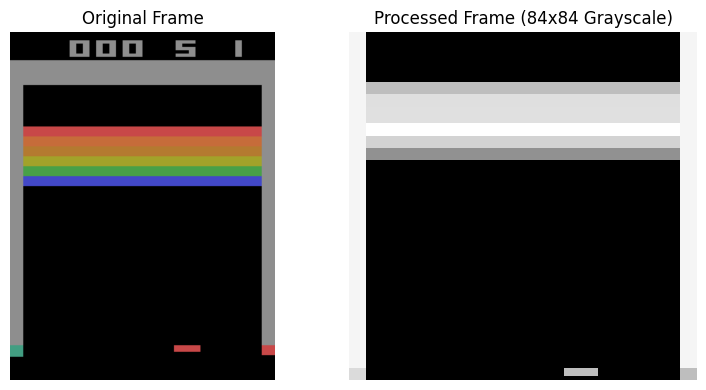

In [66]:
obs, info = env.reset()
processed = preprocess_frame(obs)
print("preprocessed frame shape: " + str(processed.shape))
show_frames(obs, processed)

In [75]:
from tensorflow.keras import layers
"Deep Q Network"

def DQN(action_dim=4, input_shape=(84, 84, 4)):
    """
    Create DQN using Sequential API (simpler but less flexible)
    """
    model = tf.keras.Sequential([
        layers.Conv2D(32, 8, strides=4, activation='relu', 
                     input_shape=input_shape, kernel_initializer='he_normal'),
        layers.Conv2D(64, 4, strides=2, activation='relu', 
                     kernel_initializer='he_normal'),
        layers.Conv2D(64, 3, strides=1, activation='relu', 
                     kernel_initializer='he_normal'),
        layers.Flatten(),
        layers.Dense(512, activation='relu', kernel_initializer='he_normal'),
        layers.Dense(action_dim, activation=None, kernel_initializer='he_normal')
    ], name='DQN_Sequential')
    
    return model

In [76]:

from collections import deque

class FrameStack:
    def __init__(self, k):
        """
        Frame stacking for temporal information in reinforcement learning.
        
        Args:
            k: Number of frames to stack (typically 4 as in DeepMind paper)
        """
        self.k = k
        self.frames = deque([], maxlen=k)

    def reset(self):
        """Call this at the beginning of an episode"""
        self.frames.clear()

    def append(self, obs):
        """
        Add a new frame to the stack.
        
        Args:
            obs: Tensor of shape (84, 84, 1) - single processed frame
        """
        self.frames.append(obs)

    def get_stack(self):
        """
        Get the stacked frames as a single tensor.
        
        Returns:
            Tensor of shape (84, 84, k) containing k stacked frames
        """
        assert len(self.frames) == self.k, f"Expected {self.k} frames, but got {len(self.frames)}"
        
        # Stack along the last dimension (channels)
        stacked = tf.concat(list(self.frames), axis=-1)
        return stacked


In [71]:
# Test the FrameStack with tensors
testFrameStack = FrameStack(4)

testFrameStack.append(a)
testFrameStack.append(a)
testFrameStack.append(a)
testFrameStack.append(a)
testOp = testFrameStack.get_stack()

print("Stacked frame shape:", testOp.shape)
print("Stacked frame:")
print(testOp.numpy().squeeze())  # Remove channel dimension for printing

Stacked frame shape: (1, 2, 8)
Stacked frame:
[[1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1.]]


In [77]:
'''
Replay Buffer
'''
class ReplayBuffer:
    def __init__(self, capacity, seed=None):
        # Initialize the buffer with a fixed capacity
        self.buffer = deque([], maxlen=capacity)
        if seed is not None:
          random.seed(seed)

    def push(self, experience):
        # Push an experience into the buffer
        self.buffer.append(experience)

    def sample(self, batch_size):
        # Sample a random mini-batch from the buffer
        return random.sample(self.buffer, batch_size)

    def size(self):
        # Return the current size of the buffer
        return len(self.buffer)

In [101]:
class Agent:

    def __init__(
        self,
        experiment_name: str,
        hyperparams: Any,
        action_space_size: int,
        device: str = '/GPU:0' if tf.config.list_physical_devices('GPU') else '/CPU:0',
        chkpt: Optional[str] = None,
    ) -> None:
        self.experiment_name = experiment_name
        self.hyperparams = hyperparams
        self.device = device
        self.action_space_size = action_space_size

        # --- Hyperparameters (copied locally for convenience) ---
        self.epsilon = float(self.hyperparams.EPSILON_START)
        self.epsilon_end = float(self.hyperparams.MIN_EPSILON)
        self.epsilon_decay_steps = int(self.hyperparams.EPSILON_DECAY_STEPS)
        self.max_ep_len = int(self.hyperparams.MAX_EPISODE_LENGTH)

        self.buffer_size = int(self.hyperparams.BUFFER_SIZE)
        self.min_buffer_size = int(self.hyperparams.MIN_BUFFER_SIZE)
        self.batch_size = int(self.hyperparams.BATCH_SIZE)

        self.lr = float(self.hyperparams.LR)
        self.gamma = float(self.hyperparams.GAMMA)
        self.update_freq = int(self.hyperparams.UPDATE_FREQ)
        self.target_update_freq = int(self.hyperparams.TARGET_UPDATE)

        self.num_episodes = int(self.hyperparams.NUM_EPISODES)
        self.frame_stack_size = int(self.hyperparams.FRAME_STACK)

        # Precompute epsilon schedule (linear)
        if self.epsilon_decay_steps > 0:
            self._epsilons = np.linspace(self.epsilon, self.epsilon_end, self.epsilon_decay_steps)
        else:
            self._epsilons = np.array([self.epsilon_end], dtype=float)

        # Runtime counters
        self.total_env_steps = 0
        self.total_grad_update_steps = 0

        # Replay buffer
        self.replay_buffer = ReplayBuffer(self.buffer_size, self.hyperparams.SEED)

        # Networks - Using your existing DQN function
        self.q_network = DQN(action_dim=action_space_size)
        self.target_network = DQN(action_dim=action_space_size)
        
        # Build networks by calling them on a sample input
        sample_input = tf.random.uniform((1, 84, 84, 4))
        _ = self.q_network(sample_input)
        _ = self.target_network(sample_input)

        if chkpt:
            print(f"Loading saved checkpoint.....{chkpt}")
            self.q_network.load_weights(chkpt)
            self.target_network.load_weights(chkpt)

        self.update_target_network()

        # Optimizer & loss
        self.optimizer = keras.optimizers.Adam(learning_rate=self.lr)
        self.loss_fn = keras.losses.Huber()

    # -------------------------
    # Helpers
    # -------------------------
    def update_target_network(self) -> None:
        """Update target network weights with Q-network weights."""
        for target_var, q_var in zip(self.target_network.trainable_variables, 
                                   self.q_network.trainable_variables):
            target_var.assign(q_var)

    def _update_epsilon(self) -> None:
        idx = min(self.total_env_steps, max(0, len(self._epsilons) - 1))
        self.epsilon = float(self._epsilons[idx])

    def epsilon_greedy_action(self, state: tf.Tensor) -> int:
        """Return action index using current epsilon-greedy policy."""
        if random.random() < self.epsilon:
            return random.randint(0, self.action_space_size - 1)
        return self.greedy_action(state)

    def greedy_action(self, state: tf.Tensor) -> int:
        q_values = self.q_network(state, training=False)
        return int(tf.argmax(q_values[0]).numpy())

    def save_model(self, path: str) -> None:
        """Save model weights with proper file extension handling"""
        # Ensure the path ends with .weights.h5
        if not path.endswith('.weights.h5'):
            if path.endswith('.h5'):
                path = path.replace('.h5', '.weights.h5')
            else:
                path = path + '.weights.h5'
        self.q_network.save_weights(path)
        print(f"Model saved to {path}")

    def load_model(self, path: str) -> None:
        """Load model weights with proper file extension handling"""
        # Try different possible extensions
        possible_paths = [path]
        if not path.endswith('.weights.h5'):
            possible_paths.append(path + '.weights.h5')
            if path.endswith('.h5'):
                possible_paths.append(path.replace('.h5', '.weights.h5'))
        
        loaded = False
        for try_path in possible_paths:
            try:
                self.q_network.load_weights(try_path)
                print(f"Model loaded from {try_path}")
                loaded = True
                break
            except (IOError, ValueError) as e:
                continue
        
        if not loaded:
            raise FileNotFoundError(f"Could not load model from any of: {possible_paths}")


    # -------------------------
    # Training update step 
    # -------------------------
    @tf.function
    def _train_step_tf(self, states, actions, rewards, next_states, dones):
        """TensorFlow function for efficient training step."""
        with tf.GradientTape() as tape:
            # Current Q values
            q_values = self.q_network(states, training=True)  # [B, A]
            q_value = tf.gather(q_values, actions, batch_dims=1)  # [B, 1]
            
            # Target Q values
            next_q_values = self.target_network(next_states, training=False)  # [B, A]
            next_q_value = tf.reduce_max(next_q_values, axis=1, keepdims=True)  # [B, 1]
            
            target = rewards + self.gamma * next_q_value * (1 - dones)
            loss = self.loss_fn(q_value, target)
        
        gradients = tape.gradient(loss, self.q_network.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.q_network.trainable_variables))
        
        return loss

    def train_step(self) -> float:
        """Sample a minibatch and perform a single gradient update. Returns loss."""
        batch = self.replay_buffer.sample(self.batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        # Convert to TensorFlow tensors
        states = tf.convert_to_tensor(np.stack(states), dtype=tf.float32) / 255.0  # [B, H, W, C]
        next_states = tf.convert_to_tensor(np.stack(next_states), dtype=tf.float32) / 255.0
        actions = tf.convert_to_tensor(actions, dtype=tf.int32)  # [B]
        rewards = tf.convert_to_tensor(rewards, dtype=tf.float32)  # [B]
        dones = tf.convert_to_tensor(dones, dtype=tf.float32)  # [B]
        
        # Reshape for gathering
        actions = tf.reshape(actions, (-1, 1))  # [B, 1]
        rewards = tf.reshape(rewards, (-1, 1))  # [B, 1]
        dones = tf.reshape(dones, (-1, 1))  # [B, 1]

        loss = self._train_step_tf(states, actions, rewards, next_states, dones)
        
        self.total_grad_update_steps += 1
        return float(loss.numpy())

    # -------------------------
    # Main training loop (controlled by NUM_EPISODES)
    # -------------------------
    def run(self, env: Any, training: bool = True) -> Tuple[keras.Model, List[float], List[float], List[int]]:
        """
        Run training controlled by number of episodes.
        Returns: (q_network, episode_rewards, epsilons, episode_lengths)
        """
        episode_rewards: List[float] = []
        epsilons: List[float] = []
        episode_lengths: List[int] = []
        frame_stack = FrameStack(self.frame_stack_size)
    
        best_avg_reward = -float("inf")
    
        # Outer loop controlled by NUM_EPISODES
        for episode in range(1, self.num_episodes + 1):
            # reset env & frame stack
            obs, info = env.reset()
            state = preprocess_frame(obs)
            frame_stack.reset()
            for _ in range(self.frame_stack_size):
                frame_stack.append(state)
            state_stack = frame_stack.get_stack()
    
            total_reward = 0.0
            ep_len = 0
            curr_life = info.get("lives", 5) if isinstance(info, dict) else 5
            life_lost = False
    
            # Episode loop
            while ep_len <= self.max_ep_len:
                # consistent "life lost" handling / initial noop-fire
                if life_lost or ep_len == 0:
                    obs_noop, _, _, _, info = env.step(1)
                    preprocessed = preprocess_frame(obs_noop)
                    frame_stack.append(preprocessed)
                    state_stack = frame_stack.get_stack()
                    life_lost = False
    
                # Prepare state tensor and choose action - FIXED VERSION
                # Handle both tensor and numpy array cases
                if tf.is_tensor(state_stack):
                    state_tensor = tf.cast(state_stack, tf.float32) / 255.0
                else:
                    state_tensor = tf.convert_to_tensor(state_stack, dtype=tf.float32) / 255.0
                
                state_tensor = tf.expand_dims(state_tensor, axis=0)  # [1, H, W, C]
                action = self.epsilon_greedy_action(state_tensor)
    
                # Step environment
                next_obs, reward, done, truncated, info = env.step(action)
    
                # detect life loss
                if isinstance(info, dict) and info.get("lives", curr_life) < curr_life:
                    life_lost = True
                    curr_life = info.get("lives", curr_life)
    
                ep_len += 1
                self.total_env_steps += 1
    
                # append next state to frame stack
                next_state = preprocess_frame(next_obs)
                frame_stack.append(next_state)
                next_state_stack = frame_stack.get_stack()
    
                # store and train (if training)
                if training:
                    # Convert tensors to numpy for storage in replay buffer
                    if tf.is_tensor(state_stack):
                        state_stack_np = state_stack.numpy()
                    else:
                        state_stack_np = state_stack
                        
                    if tf.is_tensor(next_state_stack):
                        next_state_stack_np = next_state_stack.numpy()
                    else:
                        next_state_stack_np = next_state_stack
                    
                    self.replay_buffer.push((state_stack_np, action, reward, next_state_stack_np, done or life_lost))
    
                    # warm-up: don't train until buffer has enough samples
                    if self.replay_buffer.size() < self.min_buffer_size:
                        # force full exploration until buffer is warm
                        self.epsilon = float(self.hyperparams.EPSILON_START)
                        if self.replay_buffer.size() % 10000 == 0:
                            print(f"Populating Replay Buffer... Num Steps: {self.total_env_steps}")
                        state_stack = next_state_stack
                        total_reward += reward
                        if done:
                            break
                        else:
                            continue
    
                    # perform gradient update at update frequency
                    if self.total_env_steps % self.update_freq == 0:
                        _loss = self.train_step()
                        # update epsilon according to schedule
                        self._update_epsilon()
    
                # advance state
                state_stack = next_state_stack
                total_reward += reward
    
                # target network sync
                if training and self.total_env_steps % self.target_update_freq == 0:
                    print(f"Total Env Steps: {self.total_env_steps}")
                    print("Updating Target Network")
                    self.update_target_network()
    
                if done:
                    break
    
            # end of episode bookkeeping
            episode_rewards.append(total_reward)
            epsilons.append(self.epsilon)
            episode_lengths.append(ep_len)
    
            # periodic logging
            if episode % 100 == 0:
                avgRe = float(np.mean(episode_rewards[-100:]))
                avgLen = float(np.mean(episode_lengths[-100:]))
                print(f"Env Steps: {self.total_env_steps}, Episode: {episode}")
                print(f"Average 100 Episode Reward: {avgRe:.2f}, Epsilon: {self.epsilon:.3f}, Average 100-Episode Length: {avgLen:.2f}")
                print(f"Total Steps: {self.total_env_steps}")
    
            # save best model based on 100-episode average
            if episode % 500 == 0:
                avg_100 = float(np.mean(episode_rewards[-100:])) if len(episode_rewards) >= 100 else float(np.mean(episode_rewards))
                print(f"[Episode {episode}] Average 100-episode reward: {avg_100:.2f}")
                if avg_100 > best_avg_reward:
                    best_avg_reward = avg_100
                    print("Saving Best Model...")
                    self.save_model(f"qnetwork_{self.experiment_name}_best.h5")
    
            # checkpointing by env steps (every 2,000,000 env steps)
            if self.total_env_steps > 0 and self.total_env_steps % 2_000_000 == 0:
                print(f"Saving Checkpoint Steps: [{self.total_env_steps}]")
                self.save_model(f"qnetwork_chkpt_{self.total_env_steps}.h5")
    
            # save logs occasionally
            if episode % 1000 == 0:
                log_data = {
                    "rewards": episode_rewards,
                    "episode_length": episode_lengths,
                    "epsilons": epsilons,
                }
                print("Saving logs")
                with open("training_stats_mahirean.jsonl", "w") as f:
                    f.write(json.dumps(log_data) + "\n")
    
        # finished all episodes
        return self.q_network, episode_rewards, epsilons, episode_lengths

    # -------------------------
    # Evaluation 
    # -------------------------
    def play(self, env: Any, num_episodes:int):
        frame_stack = FrameStack(self.frame_stack_size)
        total_rewards: List[float] = []
    
        for _ in range(num_episodes):
            obs, info = env.reset()
            state = preprocess_frame(obs)
            frame_stack.reset()
            for _ in range(self.frame_stack_size):
                frame_stack.append(state)
    
            state_stack = frame_stack.get_stack()
            done = False
            step_cnt = 0
            curr_life = info.get("lives", 5) if isinstance(info, dict) else 5
            epLen = 0
            life_lost = False
    
            while not done:
                if life_lost or epLen == 0:
                    obs_noop, _, _, _, info = env.step(1)
                    preprocessed = preprocess_frame(obs_noop)
                    frame_stack.append(preprocessed)
                    state_stack = frame_stack.get_stack()
                    life_lost = False
    
                epLen += 1
                # Fixed tensor handling in evaluation
                if tf.is_tensor(state_stack):
                    state_tensor = tf.cast(state_stack, tf.float32) / 255.0
                else:
                    state_tensor = tf.convert_to_tensor(state_stack, dtype=tf.float32) / 255.0
                state_tensor = tf.expand_dims(state_tensor, axis=0)
                action = self.greedy_action(state_tensor)
                next_obs, reward, done, truncated, info = env.step(action)
    
                if isinstance(info, dict) and info.get("lives", curr_life) < curr_life:
                    life_lost = True
                    curr_life = info.get("lives", curr_life)
    
                if step_cnt == 30000:
                    break
                    
                next_state = preprocess_frame(next_obs)
                frame_stack.append(next_state)
                state_stack = frame_stack.get_stack()
                step_cnt += 1
    

In [79]:
class HyperParams:
    def __init__(self):
        # Replay buffer
        self.BUFFER_SIZE = int(500000)  
        self.MIN_BUFFER_SIZE = int(50000)
        self.BATCH_SIZE = 32        

        # Epsilon-greedy exploration
        self.EPSILON_START = 1    
        self.EPSILON_DECAY_STEPS = 1000000
        self.MIN_EPSILON = 0.1

        # Target network update frequency
        self.TARGET_UPDATE = 10000    

        # Learning rate
        self.LR = 0.0001            

        # Discount factor
        self.GAMMA = 0.99            

        # Frame stack & environment
        self.FRAME_STACK = 4
        self.STATE_DIM = (self.FRAME_STACK, 84, 84)  

        # Training control
        self.NUM_EPISODES = 4000
        self.MAX_TIMESTEPS = 8000000 
        self.MAX_EPISODE_LENGTH = 20000

        self.UPDATE_FREQ = 4

        # Misc
        self.SEED = 40

In [80]:
hyperparams=HyperParams()

In [81]:
experiment_name="V1"
dqn_agent = Agent(experiment_name=experiment_name, 
                  hyperparams=hyperparams, 
                  action_space_size=4)

/Users/mahir/jupyter-env/lib/python3.13/site-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [82]:
print(dqn_agent.q_network)

<Sequential name=DQN_Sequential, built=True>


In [83]:
gym.register_envs(ale_py)
env = gym.make("ALE/Breakout-v5", render_mode = "rgb_array")

In [29]:
network, rewards, epsilons, episode_lengths =  dqn_agent.run(env, training=True)

Populating Replay Buffer... Num Steps: 10000
Populating Replay Buffer... Num Steps: 20000
Populating Replay Buffer... Num Steps: 30000
Populating Replay Buffer... Num Steps: 40000
Total Env Steps: 50000
Updating Target Network
Total Env Steps: 60000
Updating Target Network
Env Steps: 66359, Episode: 100
Average 100 Episode Reward: 1.19, Epsilon: 0.940, Average 100-Episode Length: 663.59
Total Steps: 66359
Total Env Steps: 70000
Updating Target Network
Total Env Steps: 80000
Updating Target Network
Env Steps: 82880, Episode: 200
Average 100 Episode Reward: 1.22, Epsilon: 0.925, Average 100-Episode Length: 165.21
Total Steps: 82880
Total Env Steps: 90000
Updating Target Network
Env Steps: 99912, Episode: 300
Average 100 Episode Reward: 1.33, Epsilon: 0.910, Average 100-Episode Length: 170.32
Total Steps: 99912
Total Env Steps: 100000
Updating Target Network
Total Env Steps: 110000
Updating Target Network
Env Steps: 116574, Episode: 400
Average 100 Episode Reward: 1.21, Epsilon: 0.895, Av

KeyboardInterrupt: 

In [85]:
TRAINING_STATS= "./training_stats.jsonl"
MODEL_CHKPT= "./qnetwork_V1_best.weights.h5"

In [33]:
rewards = []
episode_length = []
epsilons = []
data = []
with open(TRAINING_STATS, 'r') as f:
    for line in f:
        line=json.loads(line)
        rewards = line['rewards']
        episode_length = line['episode_length']
        epsilons = line['epsilons']

print(len(rewards), len(episode_length), len(epsilons))

6000 6000 6000


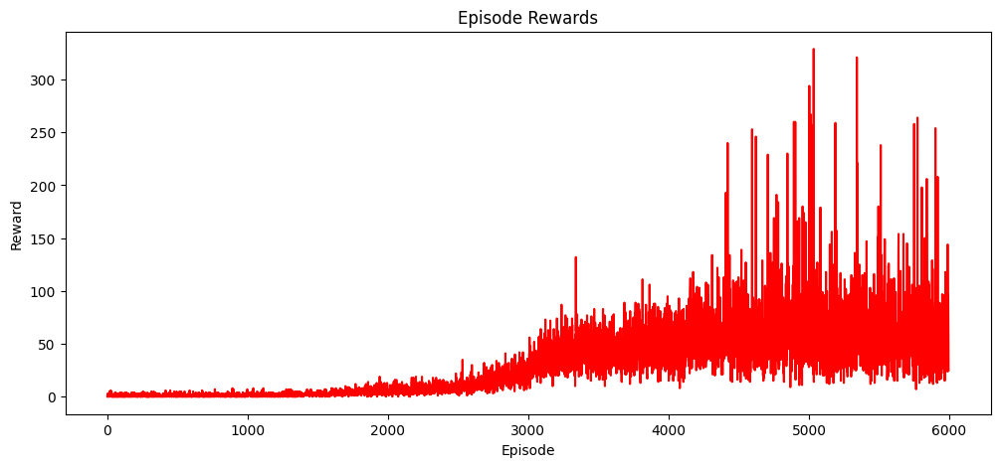

<Figure size 640x480 with 0 Axes>

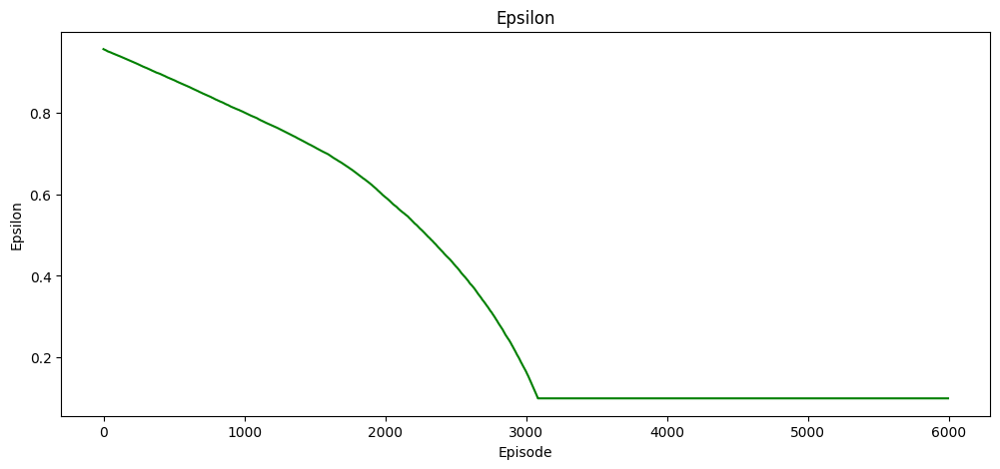

<Figure size 640x480 with 0 Axes>

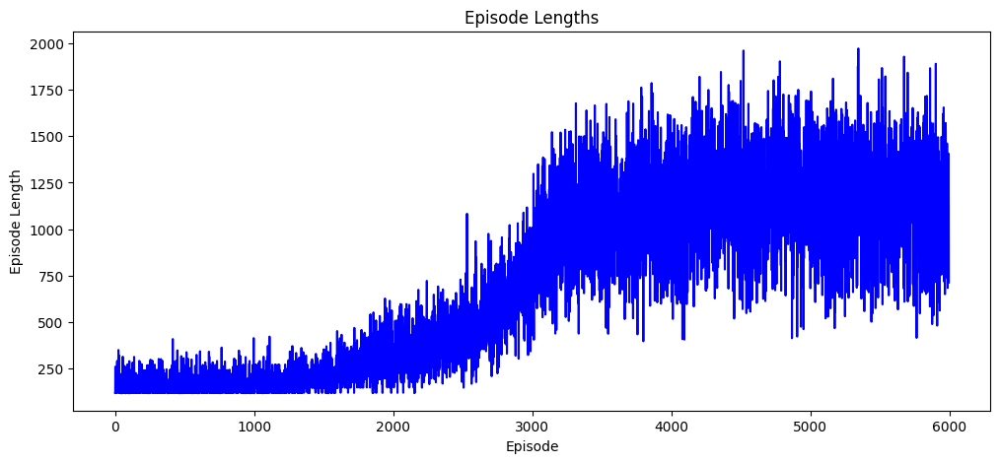

In [34]:
plot(rewards[3:], epsilons[3:], episode_length[3:])

In [102]:
inference_agent_best = Agent(experiment_name="inference", 
                  hyperparams=hyperparams, 
                  action_space_size=4,
                  device=device,
                  chkpt = MODEL_CHKPT)

Loading saved checkpoint....../qnetwork_V1_best.weights.h5


In [103]:
gym.register_envs(ale_py)
env = gym.make("ALE/Breakout-v5", render_mode = "rgb_array")

In [104]:
run=1

In [105]:
class RenderFrameWrapper:
    """
    Wraps a Gymnasium environment to capture frames during reset/step/render.
    Provides .frames list and .play() / .save(path) helpers.
    Delegates unknown attributes to the wrapped env (so your agent's code works unchanged).
    """
    def __init__(self, env, out_dir=None):
        self.env = env
        self.frames = []
        self.out_dir = out_dir
        if out_dir:
            os.makedirs(out_dir, exist_ok=True)

    # delegate attribute access so properties like .unwrapped, .action_space, etc. still work
    def __getattr__(self, name):
        return getattr(self.env, name)

    # Reset: capture initial observation
    def reset(self, *args, **kwargs):
        result = self.env.reset(*args, **kwargs)
        # Gymnasium returns (obs, info)
        if isinstance(result, tuple) and len(result) == 2:
            obs, info = result
            self._append_frame(obs)
            return obs, info
        else:
            # older gym compatibility
            self._append_frame(result)
            return result

    # Step: capture observation returned by step
    def step(self, action):
        # gymnasium step returns obs, reward, terminated, truncated, info
        result = self.env.step(action)
        # capture the observation in the first position
        if isinstance(result, tuple) and len(result) >= 1:
            obs = result[0]
            self._append_frame(obs)
        return result

    # Render: if env.render(mode='rgb_array') returns a frame, capture and return it.
    def render(self, *args, **kwargs):
        try:
            frame = self.env.render(*args, **kwargs)
            if frame is not None:
                self._append_frame(frame)
            return frame
        except Exception:
            # some envs raise if render_mode wasn't set; ignore
            return None

    def close(self):
        if hasattr(self.env, "close"):
            return self.env.close()

    def _append_frame(self, obs):
        if obs is None:
            return
        # If observation is dict (some envs), try to extract image-like key
        if isinstance(obs, dict):
            # common image keys
            for k in ["rgb", "image", "screen", "frame", "pixels"]:
                if k in obs:
                    img = obs[k]
                    self.frames.append(img)
                    return
            # otherwise store the first value
            val = next(iter(obs.values()), None)
            if val is not None:
                self.frames.append(val)
        else:
            self.frames.append(obs)

    # Play captured frames in notebook
    def play(self, interval=100):
        if len(self.frames) == 0:
            print("No frames recorded. Run your agent with this wrapped env (the wrapper collects frames on reset/step/render).")
            return
        display_animation(self.frames, interval=interval)

    # Save captured frames to file
    def save(self, filename="episode.gif", fps=10):
        if self.out_dir:
            out_path = os.path.join(self.out_dir, filename)
        else:
            out_path = filename
        save_animation(self.frames, out_path, fps=fps)
        return out_path


wrapped = RenderFrameWrapper(env, out_dir=f"output/final_sampling/{run}")
inference_agent_best.play(wrapped, num_episodes=1)

In [89]:
wrapped.play(interval=50)

2025-10-28 01:47:42,224 | Animation.save using <class 'matplotlib.animation.HTMLWriter'>
